# Audio analysis with Librosa

In [216]:
import librosa
import librosa.display
import librosa.effects
import librosa.util

import IPython.display as ipd
import soundfile as sf

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')

import warnings
warnings.filterwarnings('ignore')

---

## 1. A speech dataset

Used data is a speech dataset of conversations between bank employees and customers: https://arxiv.org/abs/2010.13929.

We can listen to the audio files to familiarize ourselves with the data. The long pauses you hear between utterances is because each audio file is from only one side of the conversation.

In [15]:
# agent part of the conversation
ipd.Audio('./sample/agent/0002f70f7386445b.wav')

In [16]:
# caller part of the conversation
ipd.Audio('./sample/caller/0002f70f7386445b.wav')

In [3]:
# sr represents a "sample rate" that converts continuous audio data to a tensor. 
# the higher the sample rate, the "higher resolution" the audio clip is.
wav_agent, sr_agent = librosa.load('./sample/agent/0002f70f7386445b.wav')
wav_caller, sr_caller = librosa.load('./sample/caller/0002f70f7386445b.wav')

## 2. Visualizing speech

In [215]:
# helper function to plot a mel spectrogram
# arguments: (wave array, sampling rate, number of mel bins, max frequency of mel scale)
def plot_melspectrogram(wav, sr, annotations=None, n_mels=256, fmax=4096, save=False):
    
    fig, ax = plt.subplots(1,1,figsize=(20,5))
    M = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=n_mels, fmax=fmax, n_fft=2048)
    M_db = librosa.power_to_db(M, ref=np.max)
    img = librosa.display.specshow(M_db, y_axis='mel', x_axis='time', ax=ax, fmax=fmax)
    ax.set(title='Mel spectrogram display')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    
    # iterate over list of text annotations and draw them
    if annotations is not None:
        for x,y,text in annotations:
            ax.annotate(
            text,
            xy=(x,y), xycoords='data',
            xytext=(10, -50), textcoords='offset pixels',
            horizontalalignment='right',
            color='white',
            fontsize=20,
            verticalalignment='bottom',
            arrowprops=dict(
                arrowstyle= '-|>',
                 color='white',
                 lw=1,
                 ls='-')
            )
    if save:
        plt.savefig('{}.png'.format(save))

In [217]:
def show_waveplot(audio_signal,sr,annotations=None, save=False):
    fig, ax = plt.subplots(1,1,figsize=(20,5))
    librosa.display.waveplot(audio_signal, sr=sr)
    # iterate over list of text annotations and draw them
    if annotations is not None:
        for x,y,text in annotations:
        
            ax.annotate(
            text,
            xy=(x,y), xycoords='data',
            xytext=(10, -50), textcoords='offset pixels',
            horizontalalignment='right',
            color='black',
            fontsize=20,
            verticalalignment='bottom',
            arrowprops=dict(
                arrowstyle= '-|>',
                 color='black',
                 lw=1,
                 ls='-')
            )
    if save:
        plt.savefig('{}.png'.format(save))

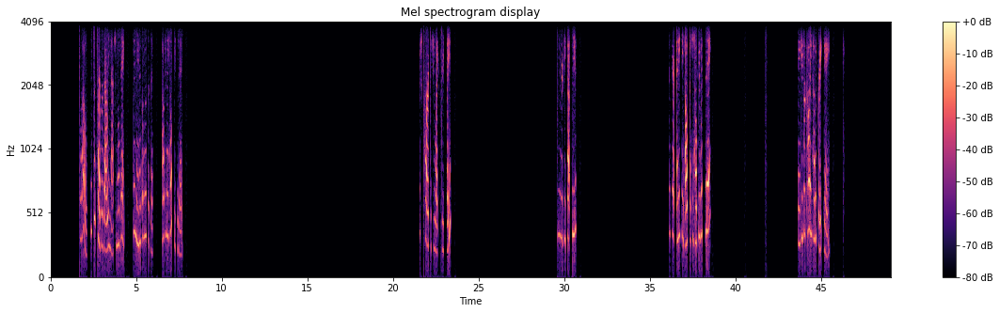

In [19]:
plot_melspectrogram(wav_agent, sr_agent)

In [21]:
wav_agent

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

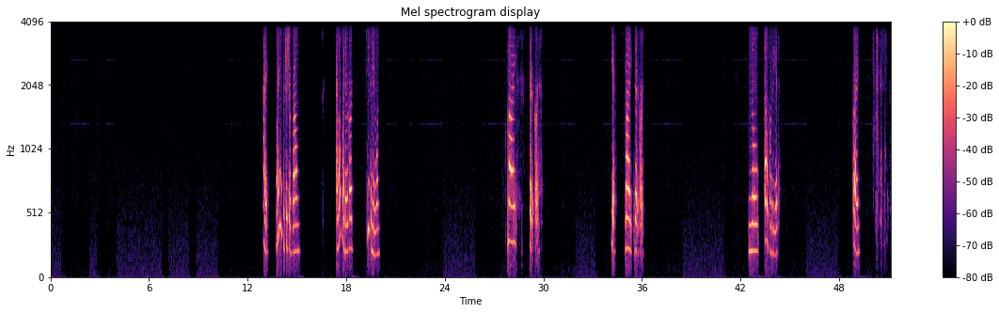

In [20]:
plot_melspectrogram(wav_caller, sr_caller)

In [22]:
wav_caller

array([0.        , 0.        , 0.        , ..., 0.00040455, 0.00011803,
       0.        ], dtype=float32)

Like above, there are long pauses in each clip where the other speaker is speaking.  These "silence" gaps are intended to allow users to recover the original conversation if needed.

## 3. Merging two sides of the conversation

Merge the agent and caller waveforms into a single waveform.

In [44]:
# since the audio files for agent and caller are of different size, we need to 
# add zero values to pad the agent wav

wav_agent_long = np.append(wav_agent, np.zeros(len(wav_caller) - len(wav_agent)))

In [45]:
len(wav_agent_long), len(wav_caller)

(1126976, 1126976)

In [48]:
# REPRODUCE (overlay to recover the original conversation)
ipd.Audio((wav_agent_long+wav_caller)/2, rate=int((sr_agent+sr_caller)/2))

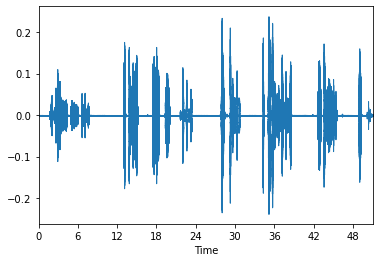

In [49]:
# display the merged waveform
librosa.display.waveplot((wav_agent_long+wav_caller)/2, sr=int((sr_agent+sr_caller)/2))

In [50]:
wav_total = (wav_agent_long+wav_caller)/2
sr_total = int((sr_agent+sr_caller)/2)

In [51]:
# SAVE TO FILE
sf.write('mywav.wav', wav_total, sr_total)

In [52]:
ipd.Audio('mywav.wav')

Let's use this helper function to visualize your merged audio file. Note the keywords used below. First we will set the max frequency considered for our mel scale (`fmax`) to the max possible frequency for this sampling rate (Nyquist Frequency, `sample_rate/2`). The number of bins is effectively the "resolution" in mel scale of the vertical axis.

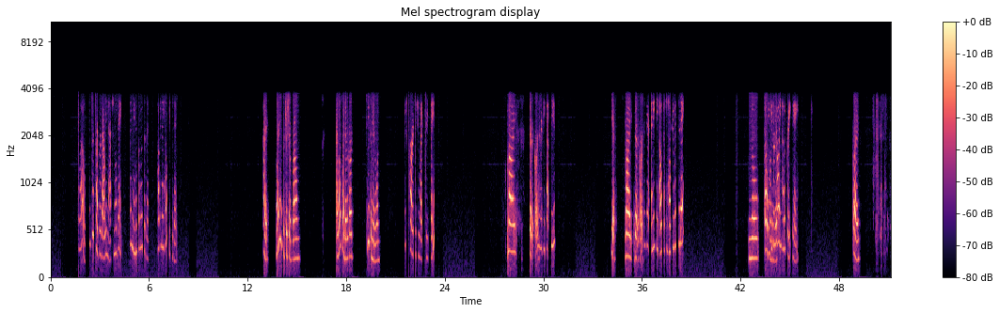

In [54]:
plot_melspectrogram(wav_total, sr_agent, annotations=None, n_mels=256, fmax=sr_agent/2)

Notice there is no energy above 4kHz. The dataset was collected using telephone speech, which has a sampling rate of 8kHz. Therefore the highest meaningful frequency in these recordings is 4kHz. Use the plotting arguments below as your default when displaying audio to hand in. For convenience we also set these as the default for the helper function.

## 4. Removing the silence

Often, we may wish to focus on a single speaker, rather than the conversation. Focusing on the **agent**, we want to remove the silences from the raw .wav file. This will collapse all of the agent's utterances into a single array with just short pauses between utterances. Removing silences in this way helps focus on the speech parts of an audio file. Sometimes this process is called _voice activity detection_, especially in scenarios with strong background noise or distortion when speech can be hard to identify from the background.  

In [12]:
# remove silence manually (excluding zero values in the wav array)
arr = np.array([i for i in wav_agent if i != 0])

In [13]:
ipd.Audio(arr, rate=sr_agent)

In [17]:
# remove silence automatically (librosa splits the audio by silence)
nonsilence = librosa.effects.split(wav_agent)
nonsilent_arr = [wav_agent[i[0]:i[1]] for i in nonsilence]
flat_nonsilent_arr = np.concatenate([i.ravel() for i in nonsilent_arr])

In [39]:
ipd.Audio(flat_nonsilent_arr, rate=sr_agent)

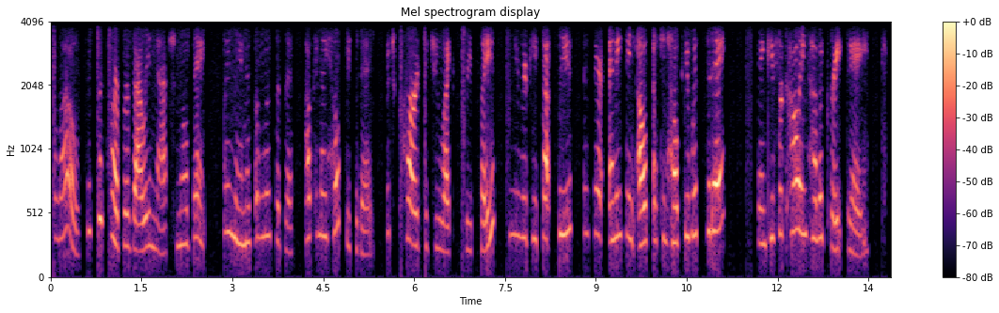

In [42]:
# we can see that now there are minimal gaps between the utterances
plot_melspectrogram(flat_nonsilent_arr, sr_agent)

## 5. Extract one utterance

Finally, an entire audio signal is too long, so let's pick the first utterance for further work.

We create a single wave array for the first part of the utterance and visualize it.

In [46]:
# we can see that there is a long pause after index=176128. that must be the end of the first agent's utterance
nonsilence

array([[  36352,   48128],
       [  50688,   96256],
       [  96768,  101376],
       [ 105472,  132608],
       [ 135680,  138240],
       [ 142848,  157696],
       [ 158208,  161792],
       [ 162816,  171520],
       [ 173568,  176128],
       [ 474624,  507904],
       [ 508416,  516096],
       [ 519680,  522240],
       [ 651264,  664576],
       [ 665088,  669696],
       [ 670208,  677888],
       [ 680960,  683520],
       [ 795648,  804864],
       [ 805376,  812032],
       [ 812544,  821760],
       [ 822272,  840704],
       [ 841216,  850944],
       [ 851456,  854528],
       [ 893440,  896512],
       [ 919552,  923648],
       [ 962048,  994304],
       [ 994816, 1004544],
       [1007104, 1010176],
       [1019904, 1023488]])

In [74]:
audio_signal = wav_agent[50688:176128]

In [75]:
# listen to your audio file
ipd.Audio(audio_signal, rate=sr_agent)

In [80]:
sf.write('first_utt.wav', audio_signal, sr_agent)

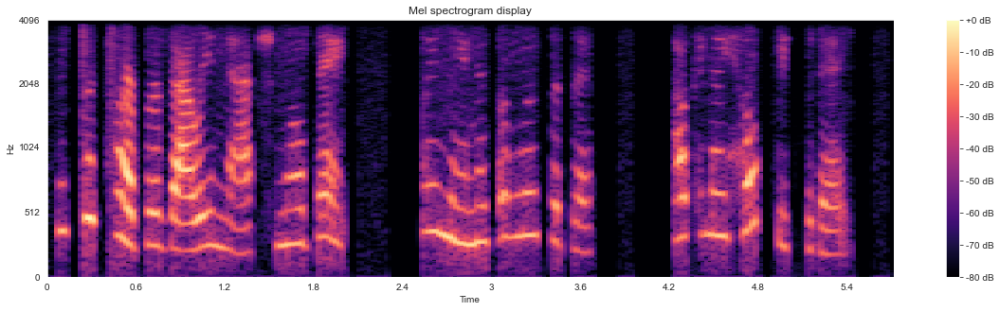

In [76]:
plot_melspectrogram(audio_signal, sr_agent)

## 6. Annotate the spectogram

Now we use what we know about how words and phones appear in time-frequency space to label the words in this utterance.

In [67]:
# annotation tuples assume the form (time (s), frequency(Hz), annotation(string))
utt_words = [(0.1, 1024, 'This'), (0.3,1024,'is')]

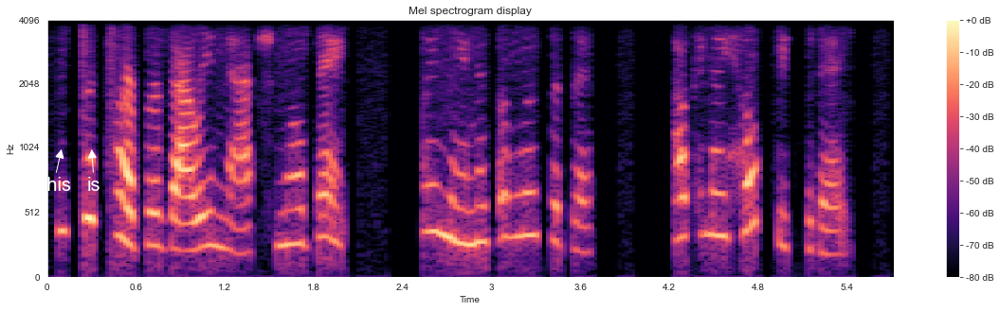

In [77]:
plot_melspectrogram(audio_signal, sr_agent, annotations=utt_words)

## 7. Annotate the waveform

In [219]:
# create a full set of word-level transcriptions for the wave plot
utt_words = [(0.1, 0, 'This'),(0.28, -0.1,'is'), (0.5, 0 , 'harper'), (0.9,-0.1,'valley'),
            (1.15, 0,'national'), (1.85, 0, 'bank'), (2.53,0,'my'), (2.7,-0.03,'name'), (2.9,0,'is'),
            (3.05,-0.06,'elisabeth'), (4.25,-0.1,'how'), (4.35,0,'can'), (4.5,0,'i'), 
            (4.7,-0.1,'help'), (4.95,0,'you'), (5.15, -0.05,'today')]

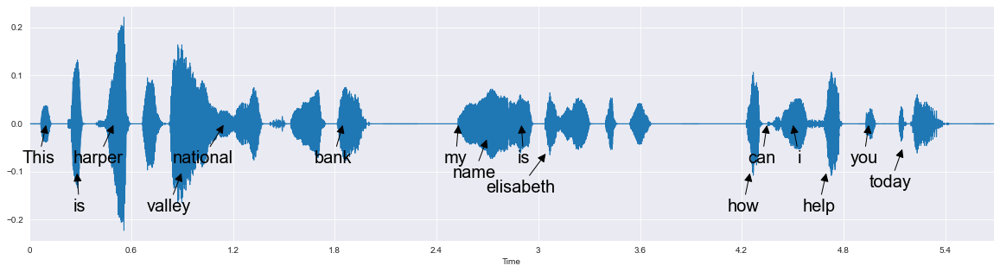

In [220]:
show_waveplot(audio_signal,sr_agent,utt_words, save='waveform')

## Shifting to the Frequency Domain

In general, it is hard to directly work with waveforms in machine learning. As you can see, there are differences in magnitude, variable lengths, and patterns are hard to discern by the human eye. So, we often rely on signal processing tools to "standardize" waveforms. In speech, it is common to convert raw waveforms to the frequency domain with fourier transforms. We've been using a specialized transform similar to fourier transforms in our Mel spectrogram plots above. In this part of the homework we will build up our own implementation of a Mel spectrogram to understand the steps involved

### Short-time fourier spectrograms

If we think of an audio signal as a composition of sound waves of different frequencies, the fourier transform allows us to decompose a waveform into a set of basis frequencies with corresponding amplitudes. So we can equivalently represent a timeseries waveform in the frequency domain (i.e. a spectrum).

In [223]:
ipd.Audio(audio_signal[:1000], rate=sr_agent)

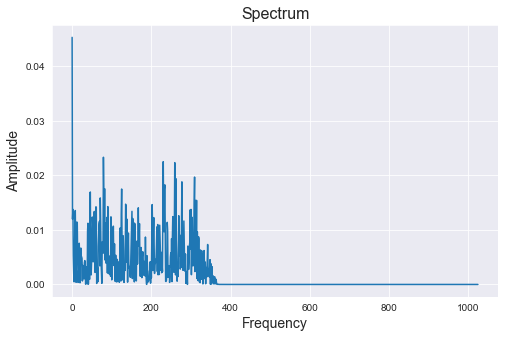

In [221]:
# example of an fft on a segment of our audio signal
segment = audio_signal[:1000]
n_fft = 2048  # number of frequencies to decompose waveform into.
spectrum = np.abs(librosa.stft(segment, hop_length=len(segment)+1))

plt.figure(figsize=(8,5))
plt.plot(spectrum)
plt.title('Spectrum', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Amplitude', fontsize=14)
plt.show()

This would suffice if the frequencies of our audio signal were constant but as in our dataset, as speakers make utterances, signal frequencies change (i.e. they are non-periodic). If we can't faithfully summarize an audio signal with a single spectrum, we can use many time slices and look at the spectrum per-slice to understand how the signal changes over time. 

Imagine breaking up a waveform into overlapping windowed segments, computing the spectrum of each segment, and plot amplitudes over time. This is called a short-time fourier transform, abbreviated `stft`.

## 8. Implement Short-time Fourier Transform

1. Slice the signal with a sliding window.
2. Apply Fast Fourier Transform on each window.
3. Concatenate the results along the first ddimension.

Example of windowing: given an audio signal of 
```
[ 1 2 3 4 5 6 7 8 9 10 ]
```
a `hop_length` of 2 and a `win_length` of 3 would result in the following windowed segments
```
[ 1 2 3 ] [ 3 4 5 ] [ 5 6 7 ] [ 7 8 9]
```
(here `n_windows = 3`). 


In [617]:
def simple_stft(y, hop_length=512, win_length=2048, n_fft=2048):
    """
    A simple short-time fourier transform. 

    Arguments
    ---------
    y: numpy array
       audio signal
    hop_length : integer [default: 512]
                 the number of samples to skip in between windows.
    win_length : integer [default: 2048]
                 the size of a single windowed segment.
    n_fft: integer [default: 2048]
           number of frequencies for fast fourier transforms.

    Outputs
    -------
    stft_matrix : numpy array
                  shape: n_fft x n_windows
                  contains amplitudes for the spectrogram.
    """

    # if-statement ensures that all windows are of the same length, 
    # i.e. excluding shorter windows at the end of the signal 
    frames = [scipy.fft.fft(y[i : i + win_length]).reshape(-1,1) for i in range(0, len(y), hop_length) 
             if y[i : i + win_length].shape[0]==win_length]

    stft_matrix = np.concatenate(frames, axis=1)
    print('Matrix shape: {}'.format(stft_matrix.shape))
    return stft_matrix

In [618]:
my_stft = simple_stft(audio_signal)

Matrix shape: (2048, 242)


In [619]:
my_stft[0].shape

(242,)

For comparison and debugging, here is the output of `librosa.stft`. Your solution will not match exactly since there are bells and whistles in their implementation that our simple one will not have. For example, due to a common issue known as aliasing, your output may have messier patterns that `librosa`'s will not have. However, the structure should look similar.

In the plot below, the x-axis is time (where index represents a windowed segment). The y-axis is frequency in hertz. Each cell represents amplitude.

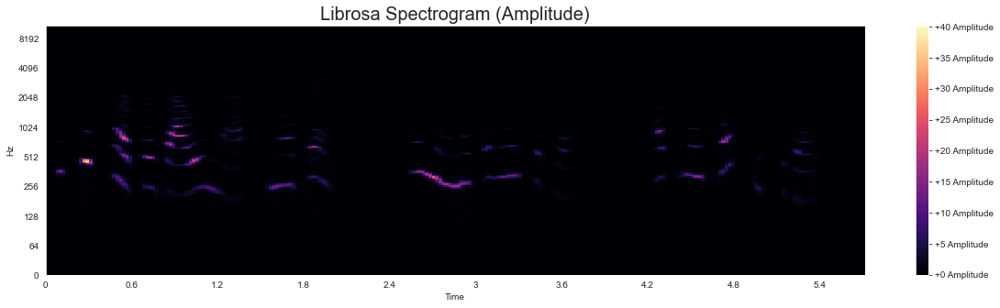

In [513]:
# NOTE: it is important to absolute value to remove complex values
lib_spec = np.abs(librosa.stft(audio_signal, hop_length=512, n_fft=2048, win_length=2048))
librosa.stft(audio_signal, hop_length=512, n_fft=2048, win_length=2048).shape
plt.figure(figsize=(20, 5))
plt.title('Librosa Spectrogram (Amplitude)', fontsize=20)
librosa.display.specshow(lib_spec, sr=sr_agent, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f Amplitude');

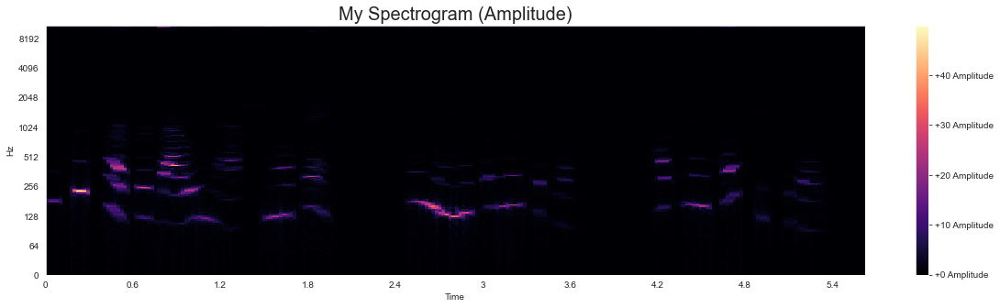

In [616]:
my_spec = np.abs(my_stft)
plt.figure(figsize=(20, 5))
plt.title('My Spectrogram (Amplitude)', fontsize=20)
librosa.display.specshow(my_spec, sr=sr_agent, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f Amplitude');

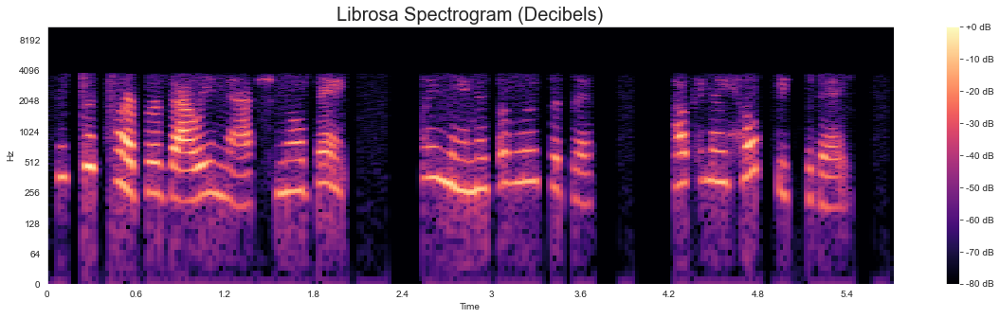

In [303]:
# we often convert amplitude to decibels before visualizing because changes in are 
# much more discernable to the human eye
lib_spec_db = librosa.amplitude_to_db(lib_spec, ref=np.max)
plt.figure(figsize=(20, 5))
plt.title('Librosa Spectrogram (Decibels)', fontsize=20)
librosa.display.specshow(lib_spec_db, sr=sr_agent, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');

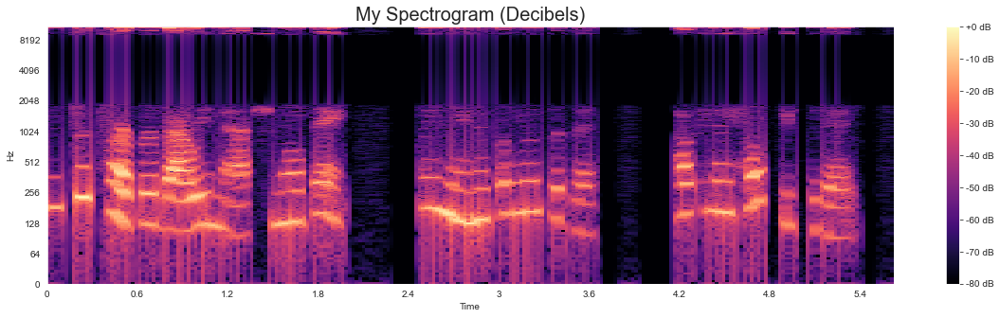

In [595]:
# repurpose the processing/visualization code from the cell above to work with your stft function

my_spec = np.abs(my_stft)
my_spec_db = librosa.amplitude_to_db(my_spec, ref=np.max)
plt.figure(figsize=(20, 5))
plt.title('My Spectrogram (Decibels)', fontsize=20)
librosa.display.specshow(my_spec_db, sr=sr_agent, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');

### Using a Mel scale

In terms of the human auditory system, not all frequencies are perceived equally. In very low or high frequencies (in hertz), our ears are less capable at discriminating between different frequencies. In the spectrograms above, we have treated all frequencies equally. This makes them look like a warped version (along the frequency axis) of the Mel spectrograms above. 

The Mel-scale is a scale of pitches judged by human listeners to be equal in distance one from another. It is roughly linear between 0 and 1000hz and logarithmic above 1000hz, as human ears become less adept at differentiating frequencies. We can think of the mel scale as a weight to multiply each frequency in a normal spectrogram to up- and down-weight different components. We can visualize it below.

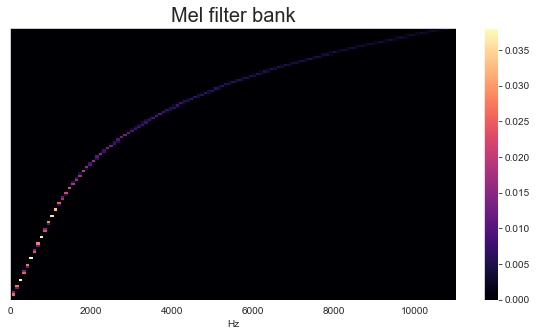

In [415]:
mel_basis = librosa.filters.mel(sr_agent, n_fft=256, n_mels=128)

plt.figure(figsize=(10,5))
librosa.display.specshow(mel_basis, x_axis='linear')
plt.title('Mel filter bank', fontsize=20)
plt.colorbar()
plt.show()

## 9. Mel frequency cepstral coefficients

We briefly discuss a second popular way to featurize timeseries audio signal. While less popular for modern speech processing e.g. neural networks, they are commonly used with more traditional statistical methods (e.g. Gaussian mixture models). We will revisit these in homework 3. 

A cepstral is a spectrum of a spectrum (e.g. nested fourier transform). MFCCs are a cepstral representation on the Mel scale. Usually, to compute MFCCs, you first do a fourier transform on the audio waveform, map to the Mel scale, followed by a second transform. 

The recursive transform has the effect of smoothing out pitch ripples (hence making signal look more "Gaussian", which is useful when training a Gausian mixture model). However, over-smoothing may remove important features relating to speaker identity or intonation that might be useful. With modern deep learning approaches, MFCCs are usually not the default choice of features. It's still good to try them when working on tasks with smaller datasets where invariance to speakers is helpful.

In [639]:
mfcc = librosa.feature.mfcc(audio_signal, hop_length=512, n_mfcc=20)

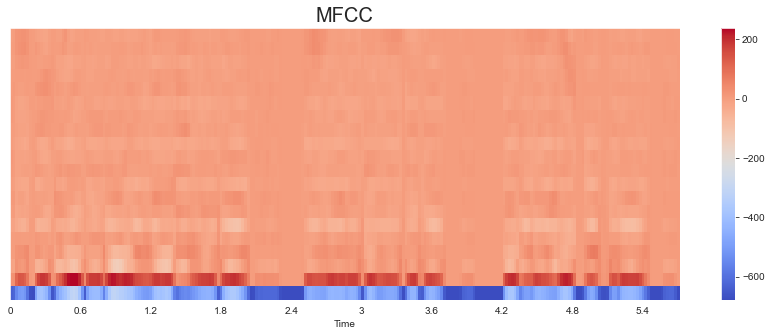

In [640]:
plt.figure(figsize=(15,5))
librosa.display.specshow(mfcc, x_axis='time')
plt.title('MFCC', fontsize=20)
plt.colorbar()
plt.show()

A downside to MFCC is that it is less interpretable. It would hard to manually annotate this cepstrum with each utterance as we did for Mel Spectrograms.

### Pitch shifting audio signals

One thing we often do with speech data is shift pitches. This could be used as data augmentation technique (e.g. to prevent overfitting when training neural networks) or as standardization technique to obscure speaker identity (e.g. for privacy purposes).

In [641]:
# recall our original snippet
ipd.Audio(audio_signal, rate=sr_agent)

We can use the `librosa.effects` library to shift our sample up and down. See the examples below and listen to the shifted samples.

In [642]:
# shift up by four half steps -- sounds like a child
audio_u4hs = librosa.effects.pitch_shift(audio_signal, sr_agent, n_steps=4)
ipd.Audio(audio_u4hs, rate=sr_agent)

In [643]:
# shift down by six half steps -- sounds like an adult man
audio_d6hs = librosa.effects.pitch_shift(audio_signal, sr_agent, n_steps=-6)
ipd.Audio(audio_d6hs, rate=sr_agent)

Pitch shift the full agent and caller audio samples as best you can to make it sound like a single person is talking. Recombine both clips into a single waveform and use `ipd.Audio` to display your results. If you're successful, it should sound like just one speaker is performing both sides of the conversation. As a baseline, it's fine to simply try to make both speakers' mean F_0 approximately equal. Try to ensure you can still understand the utterances as you work to make the speakers sound similar.

In [ ]:
wav_agent, sr_agent = librosa.load('./sample/agent/0002f70f7386445b.wav')
wav_caller, sr_caller = librosa.load('./sample/caller/0002f70f7386445b.wav')

In [ ]:
##
#
# YOUR CODE HERE
#
##

wav_total = None # TODO: recombine both clips into a single waveform (the full warped conversation)

In [ ]:
ipd.Audio(wav_total, rate=sr_agent)

In [ ]:
plot_melspectrogram(wav_total, sr_agent)

---